# Proyek Akhir: Membuat Model Sistem Rekomendasi

* Domain : Movie
* Tujuan : Membangun Model *Machine Learning* untuk Rekomendasi Film
* Dataset yang digunakan : https://www.kaggle.com/datasets/parasharmanas/movie-recommendation-system



## DATA UNDERSTANDING

### Load Dataset

Dataset merupakan data yang diperoleh melalui website GroupLens dengan judul MovieLens 25M Dataset. Langkah awal kita download terlebih dahulu dataset dengan kode berikut.

In [1]:
# loads library
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import kagglehub
import shutil

# ignore all future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


Kode ini memuat pustaka pandas, matplotlib, dan NumPy untuk manipulasi data, visualisasi, dan komputasi numerik. Sedangkan Kagglehub digunakan untuk mengakses dataset Kaggle, dan shutil menangani operasi file.

In [2]:
# Menentukan path di mana dataset akan diunduh
custom_path = "/content"

# Download dataset ke path yang ditentukan
path = kagglehub.dataset_download("parasharmanas/movie-recommendation-system")

# Tujuan path
destination_dir = "/content"

# Menyalin semua isi folder
shutil.copytree(path, destination_dir, dirs_exist_ok=True)


100%|██████████| 165M/165M [00:01<00:00, 98.8MB/s]

Extracting files...


'/content'

Kode ini mengunduh dataset Kaggle ke direktori /path menggunakan kagglehub dan menyalinnya ke direktori /content dengan shutil.copytree. Selanjutnya mari kita lihat jumlah data pada masing-masing dataset, menggunakan kode berikut :

In [3]:
movies = pd.read_csv('/content/movies.csv') #data film
ratings = pd.read_csv('/content/ratings.csv') #data ratings film

# check and count unique values in each dataframes
print('Jumlah data film: ', len(movies.movieId.unique()))
print('Jumlah data ratings: ', len(ratings.userId.unique()))


Jumlah data film:  62423
Jumlah data ratings:  162541


Jumlah data dalam dataset film cukup besar yaitu sekitar 62.423 data, sedangkan untuk ratings terdapat 162.541 data. sehingga sangat mendukung pengembangan model rekomendasi. Selanjutnya, mari kita melakukan eksplorasi terhadap data dengan teknik univariate exploratory data analysis.

## Univariate Exploratory Data Analysis

Mari kita lihat informasi dari dataset dengan menggunakan function `info()`

In [4]:
# movies information
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62423 entries, 0 to 62422
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  62423 non-null  int64 
 1   title    62423 non-null  object
 2   genres   62423 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.4+ MB


Dataset ini terdiri dari 62.423 baris dengan 3 kolom utama, yaitu movieId, title, dan genres. Selanjutnya mari kita lihat informasi rating menggunakan perintah berikut :

In [5]:
print('Banyak genre: ', len(movies.genres.unique()))
print('Tipe genre: ', movies.genres.unique())

Banyak genre:  1639
Tipe genre:  ['Adventure|Animation|Children|Comedy|Fantasy'
 'Adventure|Children|Fantasy' 'Comedy|Romance' ...
 'Children|Comedy|Fantasy|Mystery' 'Children|Comedy|Crime|Fantasy'
 'Comedy|Horror|Mystery|Sci-Fi|Western']


Dataset mencakup 1.639 kombinasi genre unik, dengan beberapa tipe genre seperti Adventure|Animation|Children|Comedy|Fantasy, Comedy|Romance, dan kombinasi lainnya yang mencakup horor, misteri, hingga fiksi ilmiah, menunjukkan keragaman genre dalam dataset.

In [6]:
# ratings information
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000095 entries, 0 to 25000094
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   userId     int64  
 1   movieId    int64  
 2   rating     float64
 3   timestamp  int64  
dtypes: float64(1), int64(3)
memory usage: 762.9 MB


Dataset ini memiliki ukuran data yang sangat besar yakni 762.9 MB, dan memiliki 4 kolom diantaranya adalah userId, movieId, rating dan timestamp. Selanjutnya mari kita lihat informasi dari rating lebih detail lagi, menggunakan perintah berikut:

In [7]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,296,5.0,1147880044
1,1,306,3.5,1147868817
2,1,307,5.0,1147868828
3,1,665,5.0,1147878820
4,1,899,3.5,1147868510


In [8]:
ratings.describe()

,userId,movieId,rating,timestamp
count,2.500010e+07,2.500010e+07,2.500010e+07,2.500010e+07
mean,8.118928e+04,2.138798e+04,3.533854e+00,1.215601e+09
std,4.679172e+04,3.919886e+04,1.060744e+00,2.268758e+08
min,1.000000e+00,1.000000e+00,5.000000e-01,7.896520e+08
25%,4.051000e+04,1.196000e+03,3.000000e+00,1.011747e+09
50%,8.091400e+04,2.947000e+03,3.500000e+00,1.198868e+09
75%,1.215570e+05,8.623000e+03,4.000000e+00,1.447205e+09
max,1.625410e+05,2.091710e+05,5.000000e+00,1.574328e+09


Dari data di ratings memiliki rata-rata rating sebesar 3.53. Sebagian besar rating berkisar antara 3.0 sampai 4.0, yang mencerminkan bahwa mayoritas film mendapatkan penilaian yang cukup baik. Rating terendah adalah 0.5, sementara yang tertinggi mencapai 5.0.

In [9]:
print('Jumlah userId: ', len(ratings.userId.unique()))
print('Jumlah movieId: ', len(ratings.movieId.unique()))
print('Jumlah data rating: ', len(ratings))

Jumlah userId:  162541
Jumlah movieId:  59047
Jumlah data rating:  25000095


Kode ini menghitung jumlah pengguna sebanyak 162.541, film 59.047 data, dan total data rating dalam dataset sebanyak 25.000.095, data ini memberikan gambaran tentang skala interaksi antara pengguna dan film.

# Data Preprocessing

In [10]:
# dataset films
movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
62418,209157,We (2018),Drama
62419,209159,Window of the Soul (2001),Documentary
62420,209163,Bad Poems (2018),Comedy|Drama
62421,209169,A Girl Thing (2001),(no genres listed)


Data yang ditampilkan merupakan sebuah dataset yang berisi informasi tentang film, dengan tiga kolom utama: movieId, title, dan genres. Dataset ini memiliki 62.423 baris yang mencakup berbagai film dari berbagai genre. Dari data di atas mari kita pisah tahun rilis dengan title untuk menghindari terjadinya redundansi data, menggunakan kode berikut :

In [11]:
#separate tittles by year of release
movies['year_of_release'] = movies.title.str.extract('([0-9]{4})')
movies.head()

,movieId,title,genres,year_of_release
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995


Ok, berhasil memisah tahun rilis dan title dengan menambahkan satu kolom year_of_release. sekarang kita hapus tahun rilis pada title menggunakan kode berikut :

In [12]:
# Convert column to string
movies['title'] = movies['title'].astype(str)

# Remove year from title
movies['title'] = movies['title'].str.split('(', n=1).str[0].str.strip()
movies

,movieId,title,genres,year_of_release
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji,Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II,Comedy,1995
...,...,...,...,...
62418,209157,We,Drama,2018
62419,209159,Window of the Soul,Documentary,2001
62420,209163,Bad Poems,Comedy|Drama,2018
62421,209169,A Girl Thing,(no genres listed),2001


Sekarang sudah terlihat rapi, dengan memisah tahun rilis dan title dengan menambahkan satu kolom year_of_release. berikutnya mari kita lihat data ratings.

In [13]:
# dataset user ratings
ratings

,userId,movieId,rating,timestamp
0,1,296,5.0,1147880044
1,1,306,3.5,1147868817
2,1,307,5.0,1147868828
3,1,665,5.0,1147878820
4,1,899,3.5,1147868510
...,...,...,...,...
25000090,162541,50872,4.5,1240953372
25000091,162541,55768,2.5,1240951998
25000092,162541,56176,2.0,1240950697
25000093,162541,58559,4.0,1240953434


Dataset di atas memberikan informasi tentang rating yang diberikan oleh pengguna pada berbagai film, dengan empat kolom utama: userId, movieId, rating, dan timestamp. Dataset ini mencakup 25.000.095 baris, yang menunjukkan interaksi antara pengguna dan film dengan berbagai rating yang diberikan. selanjutnya mari kita konversi timestamp menjadi datetime, menggunakan kode berikut:

In [14]:
# unit='s' to convert it into epoch time
import datetime

ratings.timestamp = pd.to_datetime(ratings['timestamp'], unit='s')
ratings.head()


,userId,movieId,rating,timestamp
0,1,296,5.0,2006-05-17 15:34:04
1,1,306,3.5,2006-05-17 12:26:57
2,1,307,5.0,2006-05-17 12:27:08
3,1,665,5.0,2006-05-17 15:13:40
4,1,899,3.5,2006-05-17 12:21:50


Selanjutnya kita gabungkan kedua datafreame movies dan ratings menjadi satu dataframe yang utuh.

In [15]:
# merge dataframe
films = pd.merge(movies, ratings, on='movieId', how='left')
films

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,3.5,2006-03-03 19:57:00
1,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,3.0,4.0,2015-08-13 13:23:35
2,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,4.0,3.0,2019-11-16 22:44:12
3,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,5.0,4.0,1997-03-17 19:12:29
4,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,8.0,4.0,1998-03-21 15:01:57
...,...,...,...,...,...,...,...
25003466,209157,We,Drama,2018,119571.0,1.5,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,4.5,2019-11-20 21:21:53
25003469,209169,A Girl Thing,(no genres listed),2001,119571.0,3.0,2019-11-20 23:17:06


Penggabungan ini menghasilkan data sebanyak 25.003.471 dari data sebelumnya yang masing-masing data movie hanya 62.423 dan data rating sebanyak 25.000.095

# Data Preparation

Setelah proses penggabungan, mari kita cek lagi datanya apakah ada missing value atau tidak. menggunakan kode berikut :

In [16]:
# check missing values
films.isnull().sum()

,0
movieId,0
title,0
genres,0
year_of_release,11581
userId,3376
rating,3376
timestamp,3376


Terdapat banyak missing value pada sebagian besar fitur. Hanya fitur movieId, title, ganres saja yang memiliki 0 missing value. Sehingga perlu kita drop, menggunakan kode berikut :

In [17]:
# drop missing values
films = films.dropna()
films

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,3.5,2006-03-03 19:57:00
1,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,3.0,4.0,2015-08-13 13:23:35
2,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,4.0,3.0,2019-11-16 22:44:12
3,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,5.0,4.0,1997-03-17 19:12:29
4,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,8.0,4.0,1998-03-21 15:01:57
...,...,...,...,...,...,...,...
25003466,209157,We,Drama,2018,119571.0,1.5,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,4.5,2019-11-20 21:21:53
25003469,209169,A Girl Thing,(no genres listed),2001,119571.0,3.0,2019-11-20 23:17:06


Perhatikanlah, data kita sekarang memiliki 24.988.552 baris dari data sebelumnya yang sekitas 25.003.471. tandanya data yang kosong (missing value) sudah berhasil dihapus. Untuk memastikan tidak ada missing value lagi dalam data, kita cek kode berikut:

In [18]:
# recheck missing values
films.isnull().sum()

,0
movieId,0
title,0
genres,0
year_of_release,0
userId,0
rating,0
timestamp,0


Nah, sudah bersih. Selanjutnya tadi di data movie ada yang tidak memiliki genre, untuk memastikannya mari kita cek data movie yang tidak memiliki gendre dengan menggunakan kode berikut :

In [19]:
# show non-genre
films[films['genres']=='(no genres listed)']

,movieId,title,genres,year_of_release,userId,rating,timestamp
22550152,83773,Away with Words,(no genres listed),1999,26031.0,3.0,2011-03-02 20:56:26
22550153,83773,Away with Words,(no genres listed),1999,72315.0,0.5,2016-04-26 19:13:25
22575388,84768,Glitterbug,(no genres listed),1994,72315.0,3.0,2015-12-15 08:07:44
22575389,84768,Glitterbug,(no genres listed),1994,119765.0,2.5,2011-02-28 06:24:03
22575390,84768,Glitterbug,(no genres listed),1994,137293.0,3.0,2011-02-28 13:20:48
...,...,...,...,...,...,...,...
25003446,209103,Tsar Ivan the Terrible,(no genres listed),1991,13737.0,4.0,2019-11-18 21:23:59
25003452,209133,The Riot and the Dance,(no genres listed),2018,127710.0,4.5,2019-11-19 17:57:15
25003453,209133,The Riot and the Dance,(no genres listed),2018,145795.0,0.5,2019-11-20 04:49:32
25003463,209151,Mao Zedong 1949,(no genres listed),1949,125475.0,3.5,2019-11-20 06:44:08


Terdapat 23.726 data yang tidak memiliki genre. karena datanya tidak terlalu besar mari kita hapus data tersebut menggunakan kode berikut:

In [20]:
# clean non-genre
films = films[(films.genres != '(no genres listed)')]
films

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,3.5,2006-03-03 19:57:00
1,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,3.0,4.0,2015-08-13 13:23:35
2,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,4.0,3.0,2019-11-16 22:44:12
3,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,5.0,4.0,1997-03-17 19:12:29
4,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,8.0,4.0,1998-03-21 15:01:57
...,...,...,...,...,...,...,...
25003465,209155,Santosh Subramaniam,Action|Comedy|Romance,2008,134916.0,5.0,2019-11-20 17:49:20
25003466,209157,We,Drama,2018,119571.0,1.5,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,4.5,2019-11-20 21:21:53


Dari data 24.988.552 sebelumnya, sekarang data menjadi 24.964.826 yang tandanya semua movie yang tidak memiliki genre sudah berhasil dihapus, mari kita lanjutkan ke tahapan berikutnya, yakni kita kita bulatkan angka pada rating yang sebelumnya berada di range nilai terkecil 0.5 dan nilai terbesarnya 5.0, untuk mempermudah pengkategoriannya. Sehingga rating memiliki nilai 1-5.

In [21]:
# round values
films = films.copy()
films['rating'] = films['rating'].apply(np.ceil)
films

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,4.0,2006-03-03 19:57:00
1,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,3.0,4.0,2015-08-13 13:23:35
2,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,4.0,3.0,2019-11-16 22:44:12
3,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,5.0,4.0,1997-03-17 19:12:29
4,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,8.0,4.0,1998-03-21 15:01:57
...,...,...,...,...,...,...,...
25003465,209155,Santosh Subramaniam,Action|Comedy|Romance,2008,134916.0,5.0,2019-11-20 17:49:20
25003466,209157,We,Drama,2018,119571.0,2.0,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,5.0,2019-11-20 21:21:53


Sepintas data rating sudah dibulatkan, untuk memastikan kembali mari kita cek menggukan kode berikut :

In [22]:
# check values in rating columns
films.rating.unique()

array([4., 3., 5., 2., 1.])

In [23]:
films.rating.describe()

,rating
count,2.496483e+07
mean,3.682611e+00
std,1.060913e+00
min,1.000000e+00
25%,3.000000e+00
50%,4.000000e+00
75%,4.000000e+00
max,5.000000e+00


Dari data di atas dapat kita lihat rating terkecil adalah 1 dan terbesar adalah 5, dengan sebaran data yang bervariasi ditunjukkan dari nilai Standar deviasi sebesar 1.06. Selanjutnya mari kita cek duplikasi datanya.

In [24]:
# duplicated by movieId
films.duplicated('movieId').sum()

24910474

Data yang ada berjumlah sekitar 24.964.826, terdapat duplikasi data berdasarkan `movieId` sebanyak 24.910.474.

In [25]:
# duplicated by title
films.duplicated('title').sum()

24914219

Sedangkan duplikasi data berdasarkan `title` movie sebanyak 24.914.219. Selanjutnya mari kita hapus semua data duplikat menggunakan kode berikut:

In [26]:
# drop duplicated data by movieId & title
films = films.drop_duplicates('movieId')
films = films.drop_duplicates('title')

Asik ternyata tidak ada data yang duplikat, selanjutnya kita cek pada data genre, menggunakan kode berikut:

In [27]:
# show genre films
import sys

np.set_printoptions(threshold=sys.maxsize)
print('Banyak genre films: ', len(films['genres'].unique()))
print('Genre films: ', films['genres'].unique())
np.set_printoptions(threshold=None)

Banyak genre films:  1560
Genre films:  ['Adventure|Animation|Children|Comedy|Fantasy'
 'Adventure|Children|Fantasy' 'Comedy|Romance' 'Comedy|Drama|Romance'
 'Comedy' 'Action|Crime|Thriller' 'Adventure|Children' 'Action'
 'Action|Adventure|Thriller' 'Comedy|Horror'
 'Adventure|Animation|Children' 'Drama' 'Action|Adventure|Romance'
 'Crime|Drama' 'Drama|Romance' 'Action|Comedy|Crime|Drama|Thriller'
 'Comedy|Crime|Thriller' 'Crime|Drama|Horror|Mystery|Thriller'
 'Drama|Sci-Fi' 'Children|Drama' 'Adventure|Drama|Fantasy|Mystery|Sci-Fi'
 'Mystery|Sci-Fi|Thriller' 'Adventure|Romance|IMAX' 'Documentary|IMAX'
 'Children|Comedy' 'Drama|War' 'Action|Crime|Drama'
 'Action|Adventure|Fantasy' 'Comedy|Drama|Thriller' 'Mystery|Thriller'
 'Animation|Children|Drama|Musical|Romance' 'Crime|Mystery|Thriller'
 'Action|Drama|Thriller' 'Adventure|Drama'
 'Adventure|Children|Comedy|Fantasy' 'Drama|Mystery' 'Drama|Thriller'
 'Comedy|Crime' 'Action|Sci-Fi|Thriller' 'Action|Comedy|Horror|Thriller'
 'Comedy|Dram

Hasil dari kode di atas, kita melihat genre file bernama 'Sci-Fi', yang merupakan singkatan dari 'Science Fiction' yang berarti film tersebut merupakan film fiksi ilmiah. Karena 'Sci-Fi' menggunakan tanda pisah (dash), hal ini perlu dihapus (tanda pemisahnya - dash). Jika tidak, saat tahap vektorisasi menggunakan TF-IDF, kata 'Sci-Fi' akan dianggap sebagai dua kata terpisah, yaitu 'Sci' dan 'Fi', yang bisa memengaruhi hasil analisis.

In [28]:
# replace the matching strings for 'sci-fi' using regex
films = films.replace(to_replace ='[nS]ci-Fi', value = 'Scifi', regex = True)
films

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,4.0,2006-03-03 19:57:00
57309,2,Jumanji,Adventure|Children|Fantasy,1995,9.0,5.0,1997-03-26 13:32:22
81537,3,Grumpier Old Men,Comedy|Romance,1995,8.0,4.0,1998-03-21 15:08:26
93341,4,Waiting to Exhale,Comedy|Drama|Romance,1995,141.0,3.0,1996-07-30 07:29:46
95864,5,Father of the Bride Part II,Comedy,1995,18.0,4.0,2005-02-13 05:52:25
...,...,...,...,...,...,...,...
25003465,209155,Santosh Subramaniam,Action|Comedy|Romance,2008,134916.0,5.0,2019-11-20 17:49:20
25003466,209157,We,Drama,2018,119571.0,2.0,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,5.0,2019-11-20 21:21:53


In [29]:
# Cari genre 'Sci-Fi'
sci_fi_count = films[films['genres'].str.contains('Sci-Fi', case=False)].shape[0]

print(f"Jumlah genre 'Sci-Fi': {sci_fi_count}")

Jumlah genre 'Sci-Fi': 0


Ok, sudah tidak ada genre Sci-Fi pada data kita, selanjutnya mari kita lihat distribusi pada data Rating

In [30]:
# Membuat variabel preparation yang berisi dataframe films kemudian mengurutkan berdasarkan movieId
preparation = films
preparation.sort_values('movieId')

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,4.0,2006-03-03 19:57:00
57309,2,Jumanji,Adventure|Children|Fantasy,1995,9.0,5.0,1997-03-26 13:32:22
81537,3,Grumpier Old Men,Comedy|Romance,1995,8.0,4.0,1998-03-21 15:08:26
93341,4,Waiting to Exhale,Comedy|Drama|Romance,1995,141.0,3.0,1996-07-30 07:29:46
95864,5,Father of the Bride Part II,Comedy,1995,18.0,4.0,2005-02-13 05:52:25
...,...,...,...,...,...,...,...
25003465,209155,Santosh Subramaniam,Action|Comedy|Romance,2008,134916.0,5.0,2019-11-20 17:49:20
25003466,209157,We,Drama,2018,119571.0,2.0,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,5.0,2019-11-20 21:21:53


Selanjutnya, kita perlu melakukan konversi data series menjadi list. Dalam hal ini, kita menggunakan fungsi tolist() dari library numpy. Implementasikan kode berikut.

In [31]:
# Convert data series ‘movieId’ to list form
film_id = preparation['movieId'].tolist()

# Convert data series ‘title’ to list form
film_name = preparation['title'].tolist()

# Convert data series ‘genres’ to list form
film_genre = preparation['genres'].tolist()

print(len(film_id))
print(len(film_name))
print(len(film_genre))

50607
50607
50607


Kode ini mengonversi kolom movieId, title, dan genres dari dataset preparation ke dalam bentuk daftar Python menggunakan metode .tolist(). Variabel film_id, film_name, dan film_genre masing-masing menyimpan data ID film, judul film, dan genre film dalam format `list`. Ketiga kolom di atas memiliki jumlah data yang sama yakni 50.607. Tahap berikutnya, kita akan membuat dictionary untuk menentukan pasangan key-value pada data film_id, film_name, dan genre yang telah kita siapkan sebelumnya.

In [32]:
# Create dataframe using dict form of ‘film_id’, ‘film_name’, and ‘film_genre’
df_film = pd.DataFrame({
    'film_id': film_id,
    'film_name': film_name,
    'genre': film_genre
})

df_film

,film_id,film_name,genre
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji,Adventure|Children|Fantasy
2,3,Grumpier Old Men,Comedy|Romance
3,4,Waiting to Exhale,Comedy|Drama|Romance
4,5,Father of the Bride Part II,Comedy
...,...,...,...
50602,209155,Santosh Subramaniam,Action|Comedy|Romance
50603,209157,We,Drama
50604,209159,Window of the Soul,Documentary
50605,209163,Bad Poems,Comedy|Drama


Sampai tahap ini, data telah siap untuk dimasukkan ke dalam pemodelan.

# Model Development dengan Content Based Filtering

Saatnya kita mengembangkan sistem rekomendasi dengan pendekatan *content based filtering*. Tapi sebelumnya, mari cek lagi data yang kita miliki dan assign dataframe dari tahap sebelumnya ke dalam variabel data, sebagai berikut:

In [33]:
# data sample
data = df_film
data.sample(5)

,film_id,film_name,genre
27153,136678,Tooken,Action|Comedy
6070,6274,Physical Evidence,Crime|Thriller
34957,163140,My Babysitter's a Vampire,Adventure|Children|Comedy|Fantasy
43323,186923,"Arabian Nights: Volume 2, The Desolate One",Drama
15226,83777,"Strongest Man in the World, The",Comedy|Fantasy


## TF-IDF Vectorizer

Pada tahap ini, kita akan membangun sistem rekomendasi sederhana berdasarkan genre suatu film

In [34]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Inisialisasi TfidfVectorizer
tf = TfidfVectorizer()

# Melakukan perhitungan idf pada data cuisine
tf.fit(data['genre'])

# Mapping array dari fitur index integer ke fitur nama
tf.get_feature_names_out()

array(['action', 'adventure', 'animation', 'children', 'comedy', 'crime',
       'documentary', 'drama', 'fantasy', 'film', 'horror', 'imax',
       'musical', 'mystery', 'noir', 'romance', 'scifi', 'thriller',
       'war', 'western'], dtype=object)

Selanjutnya, lakukan fit dan transformasi ke dalam bentuk matriks.

In [35]:
# Melakukan fit lalu ditransformasikan ke bentuk matrix
tfidf_matrix = tf.fit_transform(data['genre'])

# Melihat ukuran matrix tfidf
tfidf_matrix.shape

(50607, 20)

Perhatikanlah, matriks yang kita miliki berukuran (50607, 20). Nilai 50607 merupakan ukuran data dan 20 merupakan matrik genre.

Untuk menghasilkan vektor tf-idf dalam bentuk matriks, kita menggunakan fungsi todense(). Jalankan kode berikut.

In [36]:
# change tf-idf vector to matrix form
tfidf_matrix.todense()

matrix([[0.        , 0.45220295, 0.48356916, 0.48792234, 0.27226909,
         0.        , 0.        , 0.        , 0.49947442, 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.54358918, 0.        , 0.58652714, 0.        ,
         0.        , 0.        , 0.        , 0.60041379, 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.58843324,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.80854581, 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.52934164,
         0.        , 0.        , 0.43675997, 0.        , 0.        ,
         0.        , 0.        

Selanjutnya, mari kita lihat matriks tf-idf untuk beberapa film (film_name) dan genre (genre). Terapkan kode berikut.

In [37]:
# Membuat Sparse DataFrame
sparse_df = pd.DataFrame.sparse.from_spmatrix(
    tfidf_matrix,
    index=data['film_name'],             # Nama film sebagai index
    columns=tf.get_feature_names_out()  # Genre sebagai kolom
)

# Sampling pada baris dan kolom
sampled_df = sparse_df.sample(10, axis=0).sample(20, axis=1)
sampled_df

,horror,romance,fantasy,war,mystery,children,drama,action,crime,documentary,comedy,animation,film,noir,imax,scifi,thriller,adventure,musical,western
film_name,,,,,,,,,,,,,,,,,,,,
House of Angels: The Second Summer,0,0,0,0,0,0,0.636429,0,0,0,0.771335,0,0,0,0,0,0,0,0,0
Shamitabh,0,0,0,0,0,0,0.444705,0,0,0,0.538971,0,0,0,0,0,0.715366,0,0,0
The Evil in Us,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Boys Like Us,0,0,0,0,0,0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0
Silent Retreat,0.553187,0,0,0,0.672185,0,0,0,0,0,0,0,0,0,0,0,0.492089,0,0,0
Speed: In Search of Lost Time,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,0,0,0,0
"World of Henry Orient, The",0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,0,0,0
Petunia,0,0,0,0,0,0,0.636429,0,0,0,0.771335,0,0,0,0,0,0,0,0,0
Talk Radio,0,0,0,0,0,0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0


Kode ini membuat Sparse DataFrame dari matriks TF-IDF (tfidf_matrix) untuk menghubungkan film dengan genre secara efisien, menggunakan nama film sebagai indeks dan genre sebagai kolom. Selanjutnya, dilakukan sampling untuk memilih 10 baris (film) dan 20 kolom (genre) secara acak, menghasilkan subset kecil data yang siap untuk dianalisis lebih lanjut.

## Cosine Similarity

Pada tahap sebelumnya, kita telah berhasil mengidentifikasi korelasi antara film dengan gendre. Sekarang, kita akan menghitung derajat kesamaan (similarity degree) antar film dengan teknik `cosine similarity`. Di sini, kita menggunakan fungsi `cosine_similarity` dari library sklearn.

In [38]:
# calculate cosine similarity on matrix
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(tfidf_matrix, dense_output=False)

Kode ini menghitung cosine similarity dari matriks TF-IDF (tfidf_matrix) menggunakan fungsi cosine_similarity dari pustaka sklearn. Cosine similarity mengukur kesamaan antar film berdasarkan representasi TF-IDF-nya, menghasilkan nilai antara 0 hingga 1, di mana 1 menunjukkan kesamaan maksimum. Parameter dense_output=False memastikan hasilnya tetap dalam format matriks sparse untuk efisiensi memori.

In [39]:
# Konversi sparse matrix ke dense
cosine_sim_dense = cosine_sim.toarray()

# Membuat DataFrame dari dense matrix
cosine_sim_df = pd.DataFrame(
    cosine_sim_dense,
    index=data['film_name'],
    columns=data['film_name']
)

print('Shape:', cosine_sim_df.shape)

# show similarity matrix
cosine_sim_df.sample(5, axis=1).sample(10, axis=0)

Shape: (50607, 50607)


film_name,Scary Movie 4,The Child of Man,Sole a catinelle,"Russia House, The","Pervert's Guide to Ideology, The"
film_name,,,,,
Wolf Warrior 2,0.000000,0.000000,0.000000,0.000000,0.0
Eline Vere,0.000000,0.636429,0.000000,0.527950,0.0
Circus World,0.000000,0.223139,0.000000,0.185105,0.0
Rabbits,0.247838,0.577135,0.445164,0.193919,0.0
"Troll Hunter, The",0.524157,0.000000,0.000000,0.000000,0.0
Barquero,0.000000,0.000000,0.000000,0.000000,0.0
The Extreme Sukiyaki,0.000000,0.636429,0.000000,0.527950,0.0
Beauty and the Beast,0.000000,0.000000,0.000000,0.000000,0.0
Deficit,0.000000,0.636429,0.000000,0.527950,0.0


Kode ini mengonversi matriks cosine similarity dari bentuk sparse ke bentuk dense menggunakan toarray(), sehingga dapat diproses lebih lanjut. Selanjutnya, matriks dense ini digunakan untuk membuat sebuah DataFrame bernama cosine_sim_df, di mana indeks dan kolomnya adalah nama-nama film dari data['film_name'].

Dengan cosine_sim_df.shape, ukuran matriks ditampilkan sebagai (50607, 50607), menunjukkan bahwa ada 50.607 film dengan nilai kesamaan antarfilm. sample(5, axis=1).sample(10, axis=0) menampilkan subset kecil dari matriks kesamaan untuk pengamatan.

## Mendapatkan Rekomendasi

Sebelumnya, kita telah memiliki data similarity (kesamaan) antar film. selanjutnya kita buat rekomendasi film kepada pengguna, menggunakan kode berikut:

In [40]:
# function recommendations
def film_recommendations(film_name, similarity_data=cosine_sim_df, items=data[['film_name', 'genre']], k=5):
    # get data index
    index = similarity_data.loc[:,film_name].to_numpy().argpartition(
        range(-1, -k, -1))

    # retrieve data from an existing index
    closest = similarity_data.columns[index[-1:-(k+2):-1]]

    # drop film_name you want to search
    closest = closest.drop(film_name, errors='ignore')

    return pd.DataFrame(closest).merge(items).head(k)

In [41]:
# check data
data[data.film_name.eq('Toy Story')]

,film_id,film_name,genre
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy


Kode ini memeriksa dataset data untuk mencari baris yang memiliki nama film `Toy Story`

In [42]:
# get recommendations
film_recommendations('Toy Story')

,film_name,genre
0,Toy Story 2,Adventure|Animation|Children|Comedy|Fantasy
1,Trolls Holiday,Adventure|Animation|Children|Comedy|Fantasy
2,Scooby-Doo! Mask of the Blue Falcon,Adventure|Animation|Children|Comedy|Fantasy
3,"Boxtrolls, The",Adventure|Animation|Children|Comedy|Fantasy
4,Toy Story Toons: Hawaiian Vacation,Adventure|Animation|Children|Comedy|Fantasy


Berhasil! Sistem kita memberikan rekomendasi 5 film dengan genre Adventure|Animation|Children|Comedy|Fantasy

# Model Development dengan Collaborative Filtering

Sebelumnya kita telah menerapkan teknik content based filtering pada data. Teknik ini merekomendasikan item yang mirip dengan preferensi pengguna di masa lalu. Berikutnya, kita akan menerapkan teknik `collaborative filtering` untuk membuat sistem rekomendasi. Teknik ini membutuhkan data rating dari user. Sebelum itu mari kita melakukan impor library berikut :

In [43]:
# Import library
import pandas as pd
import numpy as np
from zipfile import ZipFile
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from pathlib import Path
import matplotlib.pyplot as plt

Sebelumnya, kita telah membuat variabel `preparation` dan menetapkan data pada variabel tersebut. Untuk memudahkan supaya tidak tertukar pada data, kita ubah nama variabel `preparation` menjadi df.

In [44]:
# read dataset
df = preparation
df

,movieId,title,genres,year_of_release,userId,rating,timestamp
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,4.0,2006-03-03 19:57:00
57309,2,Jumanji,Adventure|Children|Fantasy,1995,9.0,5.0,1997-03-26 13:32:22
81537,3,Grumpier Old Men,Comedy|Romance,1995,8.0,4.0,1998-03-21 15:08:26
93341,4,Waiting to Exhale,Comedy|Drama|Romance,1995,141.0,3.0,1996-07-30 07:29:46
95864,5,Father of the Bride Part II,Comedy,1995,18.0,4.0,2005-02-13 05:52:25
...,...,...,...,...,...,...,...
25003465,209155,Santosh Subramaniam,Action|Comedy|Romance,2008,134916.0,5.0,2019-11-20 17:49:20
25003466,209157,We,Drama,2018,119571.0,2.0,2019-11-20 20:12:28
25003467,209159,Window of the Soul,Documentary,2001,115835.0,3.0,2019-11-20 20:16:25
25003468,209163,Bad Poems,Comedy|Drama,2018,6964.0,5.0,2019-11-20 21:21:53


Perhatikanlah, data di atas memiliki 50.607 baris dan 7 kolom.

## Data Preparation

Kini Anda memasuki tahap preprocessing. Pada tahap ini, Anda perlu melakukan persiapan data untuk menyandikan (encode) fitur ‘userId’ dan 'movieId' ke dalam indeks integer. Terapkan kode berikut.

In [45]:
# change unique values of 'userId' to list
user_ids = df['userId'].unique().tolist()
print('list userID: ', user_ids)

# encode 'userId'
user_to_user_encoded = {x: i for i, x in enumerate(user_ids)}
print('encoded userID : ', user_to_user_encoded)

# encoding index to 'userId'
user_encoded_to_user = {i: x for i, x in enumerate(user_ids)}
print('encoded angka ke userID: ', user_encoded_to_user)

list userID:  [2.0, 9.0, 8.0, 141.0, 18.0, 427.0, 41.0, 7.0, 198.0, 187.0, 23.0, 217.0, 5.0, 12.0, 80.0, 59.0, 34.0, 3.0, 47.0, 215.0, 592.0, 167.0, 166.0, 19.0, 36.0, 1956.0, 484.0, 621.0, 407.0, 1314.0, 13.0, 105.0, 130.0, 125.0, 230.0, 865.0, 526.0, 29.0, 73.0, 72.0, 2012.0, 201.0, 45.0, 1067.0, 414.0, 152.0, 803.0, 5975.0, 115.0, 417.0, 986.0, 7086.0, 450.0, 892.0, 695.0, 124.0, 597.0, 171.0, 2887.0, 2177.0, 1339.0, 106.0, 8277.0, 757.0, 847.0, 4649.0, 4100.0, 626.0, 964.0, 79.0, 229.0, 112.0, 120.0, 25.0, 6.0, 39.0, 320.0, 179.0, 279.0, 264.0, 396.0, 371.0, 844.0, 61.0, 523.0, 1247.0, 10.0, 84.0, 235.0, 147.0, 322.0, 766.0, 100.0, 380.0, 135.0, 162.0, 226.0, 473.0, 748.0, 677.0, 199.0, 236.0, 85.0, 1297.0, 133.0, 539.0, 864.0, 6039.0, 1498.0, 663.0, 752.0, 1.0, 925.0, 173.0, 2897.0, 1425.0, 447.0, 443.0, 262.0, 341.0, 22.0, 31.0, 294.0, 55.0, 40.0, 1089.0, 190.0, 240.0, 966.0, 6394.0, 5742.0, 7288.0, 18231.0, 860.0, 7114.0, 123.0, 2965.0, 27.0, 738.0, 1646.0, 158.0, 77.0, 846.0, 1

Kode ini melakukan encoding pada kolom userId dalam dataset. Pertama, nilai unik dari userId diubah menjadi daftar menggunakan .unique().tolist(). Kemudian, setiap userId di-encode menjadi indeks numerik menggunakan dictionary user_to_user_encoded. Sebaliknya, dictionary user_encoded_to_user memetakan indeks numerik kembali ke userId asli. Ini memungkinkan representasi userId dalam bentuk numerik yang lebih mudah digunakan dalam model dan analisis.

In [46]:
# change unique values of 'movieId' to list
films_ids = df['movieId'].unique().tolist()

# encode 'movieId'
films_to_films_encoded = {x: i for i, x in enumerate(films_ids)}

# encoding index to 'movieId'
films_encoded_to_films = {i: x for i, x in enumerate(films_ids)}

Kode di atas melakukan encoding pada kolom movieId dalam dataset. Pertama, nilai unik dari movieId diubah menjadi daftar menggunakan .unique().tolist(). Kemudian, setiap movieId dipetakan ke indeks numerik melalui dictionary films_to_films_encoded. Sebaliknya, dictionary films_encoded_to_films memungkinkan pemetaan indeks numerik kembali ke movieId asli. Proses ini memungkinkan representasi movieId dalam bentuk numerik yang lebih mudah untuk digunakan dalam analisis atau model pembelajaran mesin. Berikutnya, petakan userID dan movieID ke dataframe yang berkaitan.

In [47]:
# Mapping 'userId' to dataframe
df['user'] = df['userId'].map(user_to_user_encoded)

# Mapping 'movieId' ke dataframe
df['films'] = df['movieId'].map(films_to_films_encoded)

Terakhir, cek beberapa hal dalam data seperti jumlah user, jumlah film, dan mengubah nilai rating menjadi float.

In [48]:
# get number of users
num_users = len(user_to_user_encoded)
print(num_users)

# get number of films
num_films = len(films_encoded_to_films)
print(num_films)

# change dtype
df['rating'] = df['rating'].values.astype(np.float32)

# get min values of rating
min_rating = min(df['rating'])

# get max values of rating
max_rating = max(df['rating'])

print('Number of User: {}, Number of Films: {}, Min Rating: {}, Max Rating: {}'.format(
    num_users, num_films, min_rating, max_rating
))

5391
50607
Number of User: 5391, Number of Films: 50607, Min Rating: 1.0, Max Rating: 5.0


## Membagi Data untuk Training dan Validasi

Pada tahap ini kita akan melakukan pembagian data menjadi data training dan validasi. Namun sebelumnya, acak datanya terlebih dahulu agar distribusinya menjadi random.

In [49]:
# sampling
df = df.sample(frac=1, random_state=42)
df

,movieId,title,genres,year_of_release,userId,rating,timestamp,user,films
15399499,4400,Donovan's Brain,Scifi,1953,626.0,2.0,2002-12-01 03:28:42,67,4244
22129773,74641,Singh Is Kinng,Action|Comedy|Crime|Romance,2008,2375.0,4.0,2010-10-12 19:24:14,2044,13822
24527055,154828,Hate Story 3,Thriller,2015,4019.0,3.0,2019-01-12 20:32:10,1396,32514
24981434,199390,The Truth About Lies,Comedy|Romance,2017,72315.0,3.0,2019-08-23 16:24:42,385,47767
13613063,3443,Born American,Action|Drama|Thriller,1986,5195.0,2.0,2006-12-15 17:09:28,612,3308
...,...,...,...,...,...,...,...,...,...
20736385,53774,"Mystery of Picasso, The",Documentary,1956,5572.0,4.0,2018-02-10 14:27:49,438,11284
24932539,191005,Gintama,Action|Adventure|Comedy|Scifi,2017,85212.0,5.0,2018-09-16 14:51:29,4980,44732
24765150,172489,Casper: A Spirited Beginning,Children|Comedy,1997,21529.0,3.0,2017-08-02 21:07:46,1313,38158
4979563,879,"Relic, The",Horror|Thriller,1997,187.0,4.0,2010-06-30 05:10:40,9,860


Selanjutnya, kita bagi data train dan validasi dengan komposisi 80:20. Namun sebelumnya, kita perlu memetakan (mapping) data user dan film menjadi satu value terlebih dahulu. Lalu, buatlah rating dalam skala 0 sampai 1 agar mudah dalam melakukan proses training.

In [50]:
# mapping users and films data into one value
x = df[['user', 'films']].values

# ratings
y = df['rating'].apply(lambda x: (x - min_rating) / (max_rating - min_rating)).values

# split data train and validation with 80/20 composition
train_indices = int(0.8 * df.shape[0])
x_train, x_val, y_train, y_val = (
    x[:train_indices],
    x[train_indices:],
    y[:train_indices],
    y[train_indices:]
)

print(x, y)

Streaming output truncated to the last 5000 lines.
 [  609  7083]
 [ 1315 45960]
 [   49  1279]
 [ 1999 13221]
 [ 1596 33572]
 [  385 14596]
 [  787 11382]
 [  385 37334]
 [  993 29378]
 [ 2545 50214]
 [ 1271 15358]
 [ 3303 37609]
 [ 1622 19978]
 [  385 22419]
 [  385 23236]
 [  385 42880]
 [  911  8705]
 [ 1367 31419]
 [  469 13859]
 [  385 41874]
 [  385 36220]
 [   17 20079]
 [   13  2198]
 [  438 16032]
 [  197  4425]
 [   96  6150]
 [ 3356 47057]
 [ 1365 17327]
 [    8   822]
 [ 1619 47838]
 [ 2947 21389]
 [ 4735 41124]
 [ 1862 12175]
 [ 1317 18922]
 [ 2964 47917]
 [   17  9503]
 [ 4000 31821]
 [ 1654 21591]
 [ 2442 50008]
 [  337  7970]
 [ 1438 13575]
 [ 4334 35822]
 [  688 20059]
 [  569 24160]
 [  385 39986]
 [  979  6722]
 [   13  3300]
 [   23 19694]
 [   35 31480]
 [   52  8519]
 [ 1552 49148]
 [   52 10682]
 [ 3870 30678]
 [ 5166 47063]
 [  306 10998]
 [ 3016 45368]
 [ 4927 44039]
 [ 2646 50365]
 [ 2130 19846]
 [   23 26399]
 [  385 40411]
 [ 1271 16438]
 [ 2888 47190]
 [  

## Proses Training

Selanjutnya kita membuat class RecommenderNet dengan keras Model class. Kode class RecommenderNet ini di ambil dari situs Dicoding.

In [51]:
# class recommendations
class RecommenderNet(tf.keras.Model):

  # __init__
  def __init__(self, num_users, num_films, embedding_size, **kwargs):
    super(RecommenderNet, self).__init__(**kwargs)
    self.num_users = num_users
    self.num_films = num_films
    self.embedding_size = embedding_size
    self.user_embedding = layers.Embedding( # layer embedding user
        num_users,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(1e-6)
    )
    self.user_bias = layers.Embedding(num_users, 1) # layer embedding user bias
    self.films_embedding = layers.Embedding( # layer embeddings films
        num_films,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(1e-6)
    )
    self.films_bias = layers.Embedding(num_films, 1) # layer embedding films bias

  def call(self, inputs):
    user_vector = self.user_embedding(inputs[:,0]) # layer embedding 1
    user_bias = self.user_bias(inputs[:, 0]) # layer embedding 2
    films_vector = self.films_embedding(inputs[:, 1]) # layer embedding 3
    films_bias = self.films_bias(inputs[:, 1]) # layer embedding 4

    dot_user_films = tf.tensordot(user_vector, films_vector, 2)

    x = dot_user_films + user_bias + films_bias

    return tf.nn.sigmoid(x) # activation sigmoid

Selanjutnya, lakukan proses compile terhadap model.

In [52]:
model = RecommenderNet(num_users, num_films, 50) # model initialization

# model compile
model.compile(
    loss = tf.keras.losses.BinaryCrossentropy(),
    optimizer = keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.keras.metrics.RootMeanSquaredError()]
)

Model ini menggunakan Binary Crossentropy untuk menghitung loss function, Adam (Adaptive Moment Estimation) sebagai optimizer, dan root mean squared error (RMSE) sebagai metrics evaluation. Selanjutnya, mari kita mulai proses training.

In [53]:
# training
history = model.fit(
    x = x_train,
    y = y_train,
    batch_size = 32,
    epochs = 25,
    validation_data = (x_val, y_val)
)

Epoch 1/25
1266/1266 [==============================] - 94s 74ms/step - loss: 0.6824 - root_mean_squared_error: 0.2790 - val_loss: 0.6735 - val_root_mean_squared_error: 0.2713
Epoch 2/25
1266/1266 [==============================] - 94s 74ms/step - loss: 0.6574 - root_mean_squared_error: 0.2559 - val_loss: 0.6649 - val_root_mean_squared_error: 0.2631
Epoch 3/25
1266/1266 [==============================] - 93s 73ms/step - loss: 0.6455 - root_mean_squared_error: 0.2443 - val_loss: 0.6589 - val_root_mean_squared_error: 0.2575
Epoch 4/25
1266/1266 [==============================] - 93s 73ms/step - loss: 0.6365 - root_mean_squared_error: 0.2355 - val_loss: 0.6546 - val_root_mean_squared_error: 0.2535
Epoch 5/25
1266/1266 [==============================] - 93s 73ms/step - loss: 0.6278 - root_mean_squared_error: 0.2267 - val_loss: 0.6513 - val_root_mean_squared_error: 0.2505
Epoch 6/25
1266/1266 [==============================] - 92s 73ms/step - loss: 0.6217 - root_mean_squared_error: 0.2207 -

## Visualisasi Metrik

Untuk melihat visualisasi proses training, mari kita plot metrik evaluasi dengan matplotlib. Menggunakan kode berikut.

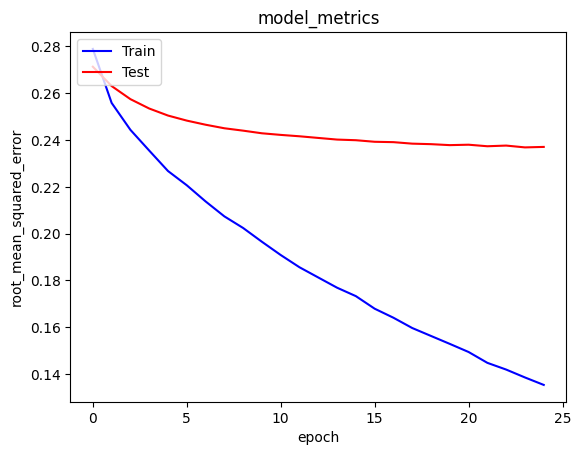

In [54]:
# plot metrics evaluations
plt.plot(history.history['root_mean_squared_error'], color='blue')
plt.plot(history.history['val_root_mean_squared_error'], color='red')
plt.title('model_metrics')
plt.ylabel('root_mean_squared_error')
plt.xlabel('epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

Berdasarkan hasil log pelatihan, terlihat bahwa nilai root_mean_squared_error (RMSE) untuk data pelatihan terus menurun secara konsisten dari 0.2790 (epoch 1) menjadi 0.1353 (epoch 25). Hal ini menunjukkan bahwa model berhasil mempelajari pola pada data pelatihan dengan baik. Untuk data validasi, nilai RMSE juga mengalami penurunan, meskipun cenderung melambat setelah beberapa epoch awal dan stabil di sekitar nilai 0.2371 pada epoch terakhir.

## Mendapatkan Rekomendasi

Untuk mendapatkan rekomendasi film, pertama kita ambil sampel user secara acak dan definisikan variabel film_not_visited yang merupakan daftar film yang belum pernah dikunjungi oleh pengguna.

In [55]:
# films
films_df = df_film
films_df.head()

,film_id,film_name,genre
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji,Adventure|Children|Fantasy
2,3,Grumpier Old Men,Comedy|Romance
3,4,Waiting to Exhale,Comedy|Drama|Romance
4,5,Father of the Bride Part II,Comedy


In [56]:
# data ratings
df = films
df.head()

,movieId,title,genres,year_of_release,userId,rating,timestamp,user,films
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995,2.0,4.0,2006-03-03 19:57:00,0,0
57309,2,Jumanji,Adventure|Children|Fantasy,1995,9.0,5.0,1997-03-26 13:32:22,1,1
81537,3,Grumpier Old Men,Comedy|Romance,1995,8.0,4.0,1998-03-21 15:08:26,2,2
93341,4,Waiting to Exhale,Comedy|Drama|Romance,1995,141.0,3.0,1996-07-30 07:29:46,3,3
95864,5,Father of the Bride Part II,Comedy,1995,18.0,4.0,2005-02-13 05:52:25,4,4


In [57]:
# taking user samples
user_id = df.userId.sample(1).iloc[0]
films_visited_by_user = df[df.userId == user_id]

# bitwise operators (~), can be found here https://docs.python.org/3/reference/expressions.html
films_not_visited = films_df[~films_df['film_id'].isin(films_visited_by_user.movieId.values)]['film_id']
films_not_visited = list(
    set(films_not_visited)
    .intersection(set(films_to_films_encoded.keys()))
)

films_not_visited = [[films_to_films_encoded.get(x)] for x in films_not_visited]
user_encoder = user_to_user_encoded.get(user_id)
user_films_array = np.hstack(
    ([[user_encoder]] * len(films_not_visited), films_not_visited)
)

Selanjutnya, untuk memperoleh rekomendasi film, gunakan fungsi model.predict() dari library Keras dengan menerapkan kode berikut.

In [58]:
# get recommendations
ratings = model.predict(user_films_array).flatten()

top_ratings_indices = ratings.argsort()[-10:][::-1]
recommended_films_ids = [
    films_encoded_to_films.get(films_not_visited[x][0]) for x in top_ratings_indices
]

print('Showing recommendations for users: {}'.format(user_id))
print('===' * 9)
print('films with high ratings from user')
print('----' * 8)

top_films_user = (
    films_visited_by_user.sort_values(
        by = 'rating',
        ascending=False
    )
    .head(5)
    .movieId.values
)

films_df_rows = films_df[films_df['film_id'].isin(top_films_user)]
for row in films_df_rows.itertuples():
    print(row.film_name, ':', row.genre)

print('----' * 8)
print('Top 10 films recommendation')
print('----' * 8)

recommended_films = films_df[films_df['film_id'].isin(recommended_films_ids)]
for row in recommended_films.itertuples():
    print(row.film_name, ':', row.genre)

1565/1565 [==============================] - 2s 1ms/step
Showing recommendations for users: 3.0
films with high ratings from user
--------------------------------
25th Hour : Crime|Drama
Wolf of Wall Street, The : Comedy|Crime|Drama
Whiplash : Drama
Gone Girl : Drama|Thriller
Ex Machina : Drama|Scifi|Thriller
--------------------------------
Top 10 films recommendation
--------------------------------
Days and Nights in the Forest : Drama
Comradeship : Drama
Nude Nuns with Big Guns : Action|Comedy
Primrose Path : Drama
White Irish Drinkers : Drama
Sleeping with Other People : Comedy|Drama|Romance
Barking at the Stars : Action|Comedy|Romance|Scifi|Thriller
Pink Floyd: Behind the Wall : Documentary
The B-Side: Elsa Dorfman's Portrait Photography : Documentary
The Emperor's Shadow : Drama


Horee, sudah berhasil memberikan rekomendasi kepada user. Hasil di atas adalah rekomendasi untuk user dengan id 3. Dari output tersebut, kita dapat membandingkan antara `films with high ratings from user` dan `Top 10 films recommendation untuk user.`